# 3D Path Spline Interpolation.
## Goal: To calculate velocity and acceleration along the trajectory.

### Authors: Harnoor Dhingra, Brett Nelson (NSDS Lab, LBNL)

#### Input files: 3D reconstructed file in suitable format as shown.

In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import cm
from matplotlib import pyplot
import matplotlib.pyplot as plt 
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation
from sys import exit
from scipy import interpolate
from mpl_toolkits.mplot3d import Axes3D
import glob
from scipy.interpolate import make_interp_spline
from scipy.interpolate import CubicSpline
%matplotlib notebook

In [3]:
%matplotlib notebook

In [4]:
input_df = pd.read_csv('Kin_11_RM13.csv')

In [5]:
input_df.head()

,bodyparts,Handle,Handle.1,Handle.2,B Handle,B Handle.1,B Handle.2,Nose,Nose.1,Nose.2,...,Third Base 2.2,Third tip 2,Third tip 2.1,Third tip 2.2,Fourth Base 2,Fourth Base 2.1,Fourth Base 2.2,Fourth tip 2,Fourth tip 2.1,Fourth tip 2.2
0,coords,X,Y,Z,X,Y,Z,X,Y,Z,...,Z,X,Y,Z,X,Y,Z,X,Y,Z
1,0,-0.009040454151160239,-0.019483533552768665,0.025478754502539485,0.027668118355450293,0.053811200605276714,0.0459031741108265,0.05970254834954528,0.04749145542902452,0.049250397114220267,...,0.05614329023570517,0.08753533095003328,0.03919929105118608,-0.000320999646611841,0.04453208560458315,0.050123913550073576,0.0952570631986719,0.08147827839486772,0.0524438588268942,0.08686935405763903
2,1,0.005257171514260717,-0.005345606927738875,-0.030779389693114428,0.028262759262751087,0.032211788767158925,0.024682484359751816,0.01402106737200328,0.010866725512041368,0.0026394401325512606,...,0.005300394571875877,0.008251229304598848,0.011550655905221394,0.013676364552721048,0.023654990976236714,0.020883748849013967,0.007929454929133684,0.010487322578159361,0.004419791659521201,0.003316367601806477
3,2,0.0052568152178848635,-0.006903705076092949,-0.030791150997353994,0.05005582200112366,0.05490366169776032,0.0396564647441805,0.029421745733480848,0.01631796964131583,0.0026652658991612424,...,0.0020297400550934627,0.008273188184822861,0.011842000479277597,0.013709536882843142,0.02367681990379813,0.02092834532651522,0.007947481544820797,0.012223038582615534,0.004425653896226596,0.0033411688300256366
4,3,0.005251246696629076,-0.006055997501254872,-0.030735671519301584,0.04983186350586189,0.05492448732278572,0.03963077673722342,0.029406704625490655,0.01629459801962825,0.002679244026181354,...,-0.0866669859957705,0.00830971945667588,0.011630406845402183,0.014135508283730074,0.023779848435818308,0.02098920472436546,0.007866661821557416,-0.05253525041284653,0.004297219384084766,0.003500315513037238


In [6]:
input_df = input_df.drop(['bodyparts'], axis = 1)
input_df = input_df[1:]
input_df.head()

,Handle,Handle.1,Handle.2,B Handle,B Handle.1,B Handle.2,Nose,Nose.1,Nose.2,Shoulder 1,...,Third Base 2.2,Third tip 2,Third tip 2.1,Third tip 2.2,Fourth Base 2,Fourth Base 2.1,Fourth Base 2.2,Fourth tip 2,Fourth tip 2.1,Fourth tip 2.2
1,-0.009040454151160239,-0.019483533552768665,0.025478754502539485,0.027668118355450293,0.053811200605276714,0.0459031741108265,0.05970254834954528,0.04749145542902452,0.049250397114220267,0.045320299799639564,...,0.05614329023570517,0.08753533095003328,0.03919929105118608,-0.000320999646611841,0.04453208560458315,0.050123913550073576,0.0952570631986719,0.08147827839486772,0.0524438588268942,0.08686935405763903
2,0.005257171514260717,-0.005345606927738875,-0.030779389693114428,0.028262759262751087,0.032211788767158925,0.024682484359751816,0.01402106737200328,0.010866725512041368,0.0026394401325512606,0.009013877582897022,...,0.005300394571875877,0.008251229304598848,0.011550655905221394,0.013676364552721048,0.023654990976236714,0.020883748849013967,0.007929454929133684,0.010487322578159361,0.004419791659521201,0.003316367601806477
3,0.0052568152178848635,-0.006903705076092949,-0.030791150997353994,0.05005582200112366,0.05490366169776032,0.0396564647441805,0.029421745733480848,0.01631796964131583,0.0026652658991612424,-0.003263904567175302,...,0.0020297400550934627,0.008273188184822861,0.011842000479277597,0.013709536882843142,0.02367681990379813,0.02092834532651522,0.007947481544820797,0.012223038582615534,0.004425653896226596,0.0033411688300256366
4,0.005251246696629076,-0.006055997501254872,-0.030735671519301584,0.04983186350586189,0.05492448732278572,0.03963077673722342,0.029406704625490655,0.01629459801962825,0.002679244026181354,-0.0032660071502159907,...,-0.0866669859957705,0.00830971945667588,0.011630406845402183,0.014135508283730074,0.023779848435818308,0.02098920472436546,0.007866661821557416,-0.05253525041284653,0.004297219384084766,0.003500315513037238
5,0.005261091553335173,0.0033282915600957455,-0.03068386959030732,0.049667618185831604,0.0549469638340466,0.03963865985416333,0.029380815884788337,0.016214185609110292,0.0027355686860419536,-0.0032733585493004477,...,0.003024221190540488,0.008320916403652092,0.011770920488730127,0.016580338999208445,0.02407671068832805,0.02125283834844583,0.00985603452260486,0.0064499987324665095,0.004304893690533364,0.005043628562073721


In [7]:
input_df = input_df.astype(float).round(4)
input_df.head()

,Handle,Handle.1,Handle.2,B Handle,B Handle.1,B Handle.2,Nose,Nose.1,Nose.2,Shoulder 1,...,Third Base 2.2,Third tip 2,Third tip 2.1,Third tip 2.2,Fourth Base 2,Fourth Base 2.1,Fourth Base 2.2,Fourth tip 2,Fourth tip 2.1,Fourth tip 2.2
1,-0.0090,-0.0195,0.0255,0.0277,0.0538,0.0459,0.0597,0.0475,0.0493,0.0453,...,0.0561,0.0875,0.0392,-0.0003,0.0445,0.0501,0.0953,0.0815,0.0524,0.0869
2,0.0053,-0.0053,-0.0308,0.0283,0.0322,0.0247,0.0140,0.0109,0.0026,0.0090,...,0.0053,0.0083,0.0116,0.0137,0.0237,0.0209,0.0079,0.0105,0.0044,0.0033
3,0.0053,-0.0069,-0.0308,0.0501,0.0549,0.0397,0.0294,0.0163,0.0027,-0.0033,...,0.0020,0.0083,0.0118,0.0137,0.0237,0.0209,0.0079,0.0122,0.0044,0.0033
4,0.0053,-0.0061,-0.0307,0.0498,0.0549,0.0396,0.0294,0.0163,0.0027,-0.0033,...,-0.0867,0.0083,0.0116,0.0141,0.0238,0.0210,0.0079,-0.0525,0.0043,0.0035
5,0.0053,0.0033,-0.0307,0.0497,0.0549,0.0396,0.0294,0.0162,0.0027,-0.0033,...,0.0030,0.0083,0.0118,0.0166,0.0241,0.0213,0.0099,0.0064,0.0043,0.0050


In [8]:
# x1, y1, z1 = input_df["Handle"][100:200], input_df["Handle.1"][100:200], input_df["Handle.2"][100:200]
x1, y1, z1 = input_df["Handle"][500:600], input_df["Handle.1"][500:600], input_df["Handle.2"][500:600]
x2, y2, z2 = input_df["B Handle"][500:600], input_df["B Handle.1"][500:600], input_df["B Handle.2"][500:600]
x3, y3, z3 = input_df["Nose"][500:600], input_df["Nose.1"][500:600], input_df["Nose.2"][500:600]
x4, y4, z4 = input_df["Shoulder 1"][500:600], input_df["Shoulder 1.1"][500:600], input_df["Shoulder 1.2"][500:600]
x5, y5, z5 = input_df["Forearm 1"][500:600], input_df["Forearm 1.1"][500:600], input_df["Forearm 1.2"][500:600]
# x6, y6, z6 = input_df["Wrist 1"][500:600], input_df["Wrist 1.1"][500:600], input_df["Wrist 1.2"][500:600]
x6, y6, z6 = input_df["Palm 1"][500:600], input_df["Palm 1.1"][500:600], input_df["Palm 1.2"][500:600]
x7, y7, z7 = input_df["Shoulder 2"][500:600], input_df["Shoulder 2.1"][500:600], input_df["Shoulder 2.2"][500:600]
x8, y8, z8 = input_df["Forearm 2"][500:600], input_df["Forearm 2.1"][500:600], input_df["Forearm 2.2"][500:600]
# x10, y10, z10 = input_df["Wrist 1"][500:600], input_df["Wrist 1.1"][500:600], input_df["Wrist 1.2"][500:600]
x9, y9, z9 = input_df["Palm 2"][500:600], input_df["Palm 2.1"][500:600], input_df["Palm 2.2"][500:600]

In [9]:
x1 = np.array(x1)
y1 = np.array(y1)
z1 = np.array(z1)

x2 = np.array(x2)
y2 = np.array(y2)
z2 = np.array(z2)

x3 = np.array(x3)
y3 = np.array(y3)
z3 = np.array(z3)

x4 = np.array(x4)
y4 = np.array(y4)
z4 = np.array(z4)

x5 = np.array(x5)
y5 = np.array(y5)
z5 = np.array(z5)

x6 = np.array(x6)
y6 = np.array(y6)
z6 = np.array(z6)

x7 = np.array(x7)
y7 = np.array(y7)
z7 = np.array(z7)

x8 = np.array(x8)
y8 = np.array(y8)
z8 = np.array(z8)

x9 = np.array(x9)
y9 = np.array(y9)
z9 = np.array(z9)

In [10]:
# Handle coordinates for marking
x_h, y_h, z_h = input_df["Handle"][400:500], input_df["Handle.1"][400:500], input_df["Handle.2"][400:500]
x_h = np.array(x_h)
y_h = np.array(y_h)
z_h = np.array(z_h)
#z_h = z_h*(-1)
x_h = x_h*(-1)
y_h = y_h*(-1)

In [11]:
# z1 = z1*(-1) # Handle not invert?
# z2 = z2*(-1) # Handle not invert?
z3 = z3*(-1)
z4 = z4*(-1)
z5 = z5*(-1)
z6 = z6*(-1)
z7 = z7*(-1)
z8 = z8*(-1)
z9 = z9*(-1)

In [12]:
# okay = np.where(np.abs(np.diff(x1)) + np.abs(np.diff(y1)) + np.abs(np.diff(z1))  > 0)
# x1 = np.r_[x1[okay], x1[-1], x1[0]]
# y1 = np.r_[y1[okay], y1[-1], y1[0]]
# z1 = np.r_[z1[okay], z1[-1], z1[0]]

# # okay = np.where(np.abs(np.diff(x2)) + np.abs(np.diff(y2)) + np.abs(np.diff(z2))  > 0)
# # x2 = np.r_[x2[okay], x2[-1], x2[0]]
# # x2 = np.r_[y2[okay], y2[-1], y2[0]]
# # z2 = np.r_[z2[okay], z2[-1], z2[0]]

# # okay = np.where(np.abs(np.diff(x3)) + np.abs(np.diff(y3)) + np.abs(np.diff(z3))  > 0)
# # x3 = np.r_[x3[okay], x3[-1], x3[0]]
# # y3 = np.r_[y3[okay], y3[-1], y3[0]]
# # z3 = np.r_[z3[okay], z3[-1], z3[0]]

# okay = np.where(np.abs(np.diff(x4)) + np.abs(np.diff(y4)) + np.abs(np.diff(z4))  > 0)
# x4 = np.r_[x4[okay], x4[-1], x4[0]]
# y4 = np.r_[y4[okay], y4[-1], y4[0]]
# z4 = np.r_[z4[okay], z4[-1], z4[0]]

# # okay = np.where(np.abs(np.diff(x5)) + np.abs(np.diff(y5)) + np.abs(np.diff(z5))  > 0)
# # x5 = np.r_[x5[okay], x5[-1], x5[0]]
# # y5 = np.r_[y5[okay], y5[-1], y5[0]]
# # z5 = np.r_[z5[okay], z5[-1], z5[0]]

# # okay = np.where(np.abs(np.diff(x6)) + np.abs(np.diff(y6)) + np.abs(np.diff(z6))  > 0)
# # x6 = np.r_[x6[okay], x6[-1], x6[0]]
# # y6 = np.r_[y6[okay], y6[-1], y6[0]]
# # z6 = np.r_[z6[okay], z6[-1], z6[0]]

# # okay = np.where(np.abs(np.diff(x7)) + np.abs(np.diff(y7)) + np.abs(np.diff(z7))  > 0)
# # x7 = np.r_[x7[okay], x7[-1], x7[0]]
# # y7 = np.r_[y7[okay], y7[-1], y7[0]]
# # z7 = np.r_[z7[okay], z7[-1], z7[0]]

# # okay = np.where(np.abs(np.diff(x8)) + np.abs(np.diff(y8)) + np.abs(np.diff(z8))  > 0)
# # x8 = np.r_[x8[okay], x8[-1], x8[0]]
# # y8 = np.r_[y8[okay], y8[-1], y8[0]]
# # z8 = np.r_[z8[okay], z8[-1], z8[0]]

# Spline with One Dimensional Plots

## Handle

In [13]:
frame_axis = range(0,100,1)
frame_axis2 = np.arange(0, 99, 0.00001)
c = frame_axis

In [14]:
cs_x = CubicSpline(frame_axis, x1)
cs_y = CubicSpline(frame_axis, y1)
cs_z = CubicSpline(frame_axis, z1)

x1_splined = cs_x(frame_axis2)
y1_splined = cs_y(frame_axis2)
z1_splined = cs_z(frame_axis2)

x1_vel = cs_x(frame_axis2, 1)
y1_vel = cs_y(frame_axis2, 1)
z1_vel = cs_z(frame_axis2, 1)

x1_acc = cs_x(frame_axis2, 2)
y1_acc = cs_y(frame_axis2, 2)
z1_acc = cs_z(frame_axis2, 2)

<IPython.core.display.Javascript object>


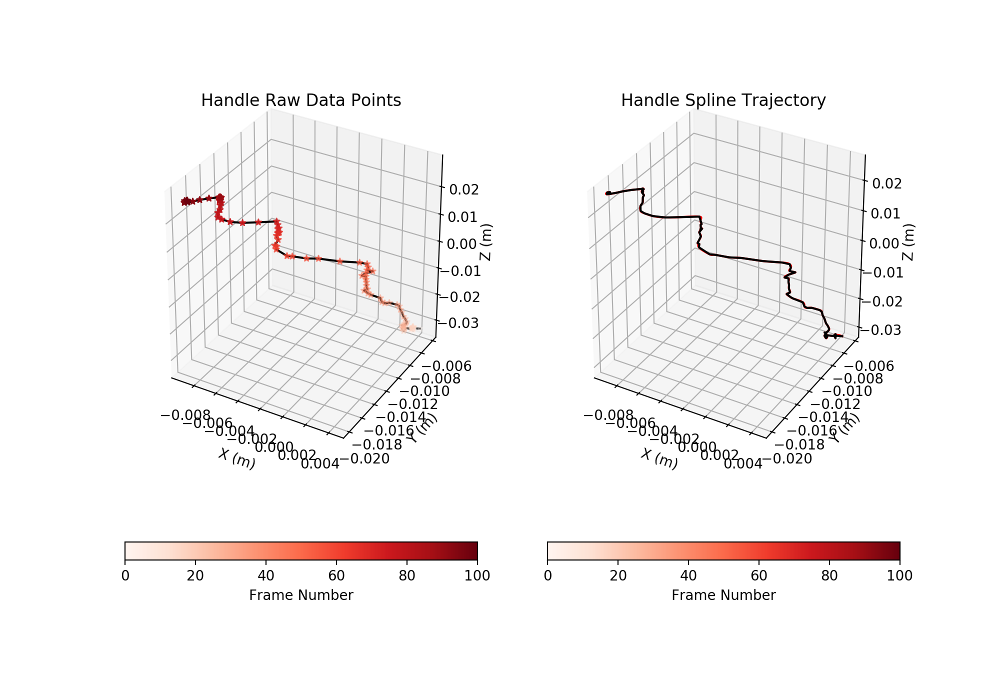

In [15]:
cm = plt.cm.get_cmap('Reds')
cm2 = plt.cm.get_cmap('Greens')

fig1 = pyplot.figure()
fig1.set_figheight(7)
fig1.set_figwidth(10)

ax = fig1.add_subplot(1, 2, 1, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Raw Data Points')

p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
ax.plot(x1, y1, z1, color = 'black')
cbar = fig1.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig1.add_subplot(1, 2, 2, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Handle Spline Trajectory')

# p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
ax.plot(x1_splined, y1_splined, z1_splined, color = 'red')
ax.plot(x1, y1, z1, color = 'black')
cbar = fig1.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

pyplot.show()

<IPython.core.display.Javascript object>


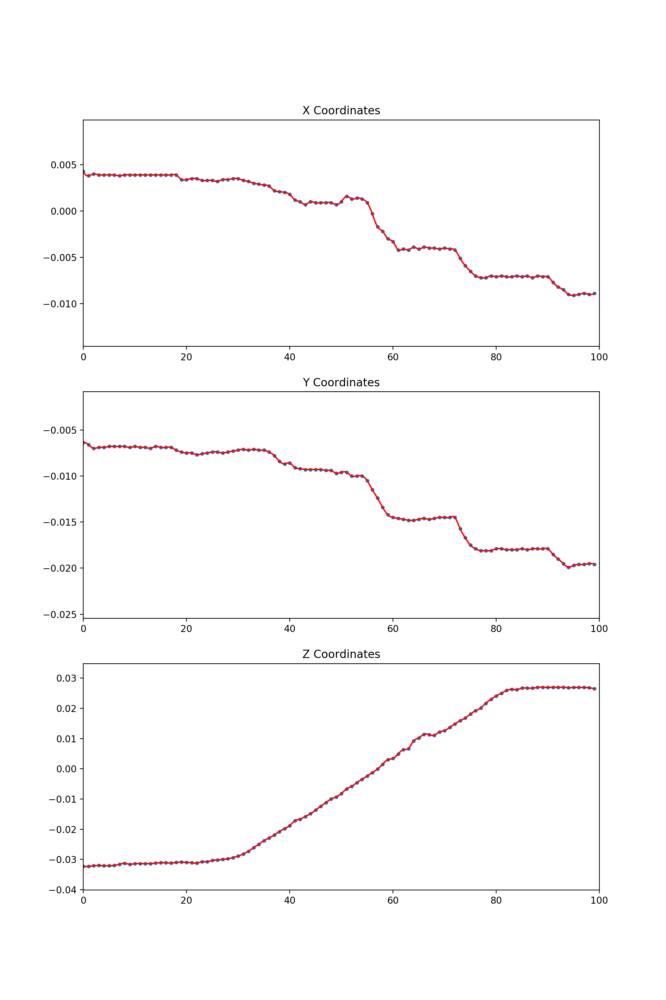

In [16]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 1, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.scatter(frame_axis, x1, marker = '.')
plt.plot(frame_axis2, x1_splined, color = 'r')

plt.subplot(3, 1, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.scatter(frame_axis, y1, marker = '.')
plt.plot(frame_axis2, y1_splined, color = 'r')

plt.subplot(3, 1, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.scatter(frame_axis, z1, marker = '.')
plt.plot(frame_axis2, z1_splined, color = 'r')

<IPython.core.display.Javascript object>


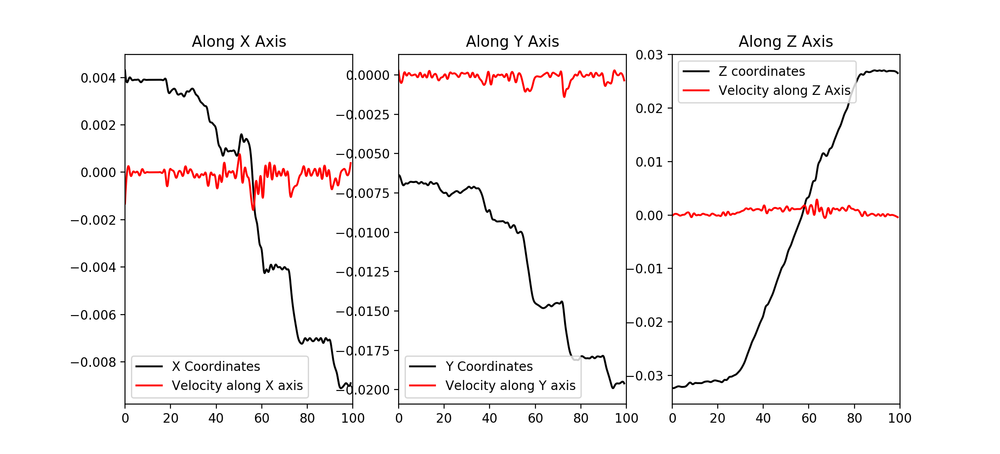

In [21]:
fig = plt.figure(figsize=(11,5))

plt.subplot(1, 3, 1)
plt.xlim(0, 100)
plt.title('Along X Axis')
# plt.ylim(-0.008, 0.004)
plt.plot(frame_axis2, x1_splined, color = 'black', label = 'X Coordinates')
plt.plot(frame_axis2, x1_vel, color = 'red', label = 'Velocity along X axis')
plt.legend(loc='lower left')

plt.subplot(1, 3, 2)
plt.xlim(0, 100)
plt.title('Along Y Axis')
# plt.ylim(-0.02, 0.02)
plt.plot(frame_axis2, y1_splined, color = 'black', label = 'Y Coordinates')
plt.plot(frame_axis2, y1_vel, color = 'red', label = 'Velocity along Y axis')
plt.legend(loc='lower left')

plt.subplot(1, 3, 3)
plt.xlim(0, 100)
plt.title('Along Z Axis')
# plt.ylim(-0.03, 0.03)
plt.plot(frame_axis2, z1_splined, color = 'black', label = 'Z coordinates')
plt.plot(frame_axis2, z1_vel, color = 'red', label = 'Velocity along Z Axis')
plt.legend(loc='upper left')

# plt.subplot(3, 3, 4)
# plt.xlim(0, 100)
# plt.title('Velocity X')
# # plt.ylim(-0.008, 0.004)
# plt.plot(frame_axis2, x1_vel, color = 'black')

# plt.subplot(3, 3, 5)
# plt.xlim(0, 100)
# plt.title('Velocity Y')
# # plt.ylim(-0.02, 0.02)
# plt.plot(frame_axis2, y1_vel, color = 'black')

# plt.subplot(3, 3, 6)
# plt.xlim(0, 100)
# plt.title('Velocity Z')
# # plt.ylim(-0.03, 0.03)
# plt.plot(frame_axis2, z1_vel, color = 'black')

# plt.subplot(3, 3, 7)
# plt.xlim(0, 100)
# plt.title('Acc X')
# # plt.ylim(-0.008, 0.004)
# plt.plot(frame_axis2, x1_acc, color = 'black')

# plt.subplot(3, 3, 8)
# plt.xlim(0, 100)
# plt.title('Acc Y')
# # plt.ylim(-0.02, 0.02)
# plt.plot(frame_axis2, y1_acc, color = 'black')

# plt.subplot(3, 3, 9)
# plt.xlim(0, 100)
# plt.title('Acc Z')
# # plt.ylim(-0.03, 0.03)
# plt.plot(frame_axis2, z1_acc, color = 'black')

## B Handle

In [22]:
cs_x = CubicSpline(frame_axis, x2)
cs_y = CubicSpline(frame_axis, y2)
cs_z = CubicSpline(frame_axis, z2)

x2_splined = cs_x(frame_axis2)
y2_splined = cs_y(frame_axis2)
z2_splined = cs_z(frame_axis2)

x2_vel = cs_x(frame_axis2, 1)
y2_vel = cs_y(frame_axis2, 1)
z2_vel = cs_z(frame_axis2, 1)

x2_acc = cs_x(frame_axis2, 2)
y2_acc = cs_y(frame_axis2, 2)
z2_acc = cs_z(frame_axis2, 2)

<IPython.core.display.Javascript object>


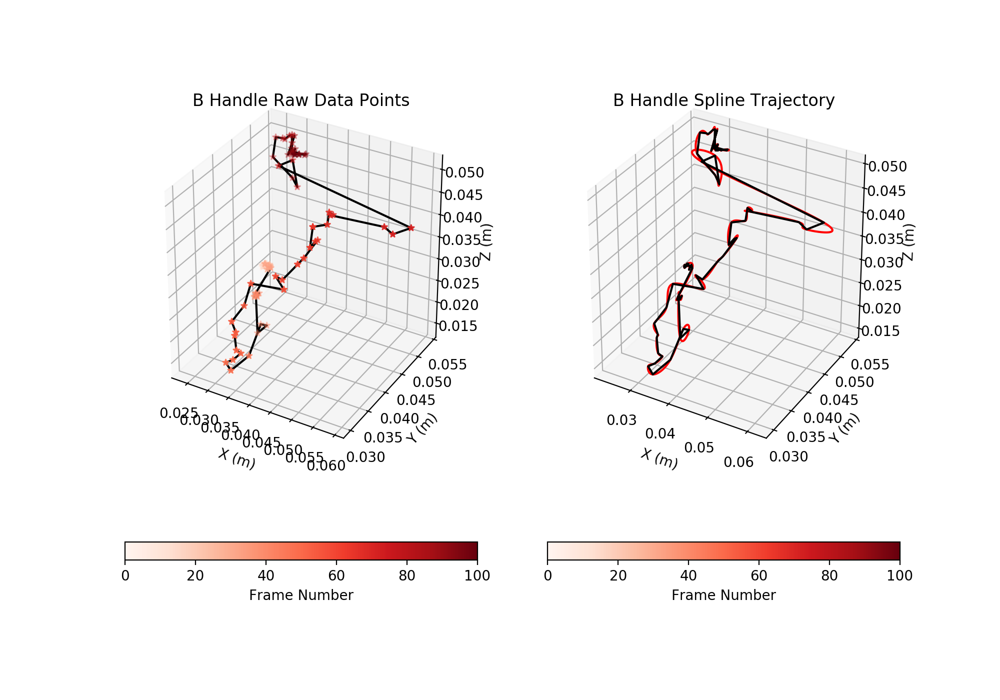

In [23]:
cm = plt.cm.get_cmap('Reds')
cm2 = plt.cm.get_cmap('Greens')

fig2 = pyplot.figure()
fig2.set_figheight(7)
fig2.set_figwidth(10)

ax = fig2.add_subplot(1, 2, 1, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('B Handle Raw Data Points')

p = ax.scatter(x2, y2, z2, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
ax.plot(x2, y2, z2, color = 'black')
cbar = fig2.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig2.add_subplot(1, 2, 2, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('B Handle Spline Trajectory')

# p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
ax.plot(x2_splined, y2_splined, z2_splined, color = 'red')
ax.plot(x2, y2, z2, color = 'black')
cbar = fig2.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

pyplot.show()

<IPython.core.display.Javascript object>


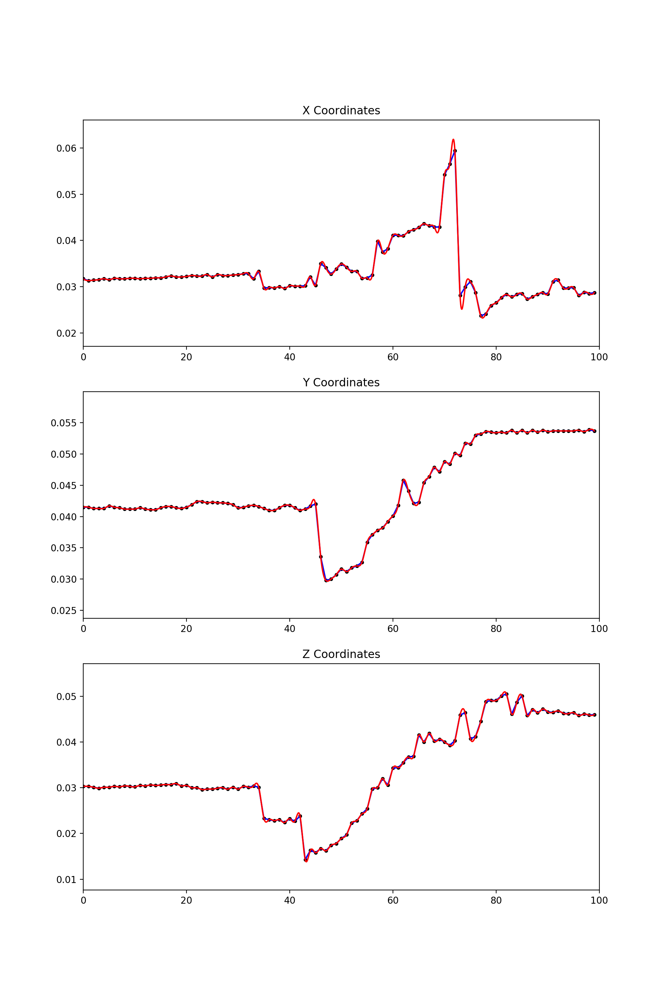

In [24]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 1, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.scatter(frame_axis, x2, marker = '.', color = 'black')
plt.plot(frame_axis, x2, color = 'b')
plt.plot(frame_axis2, x2_splined, color = 'r')

plt.subplot(3, 1, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.scatter(frame_axis, y2, marker = '.', color = 'black')
plt.plot(frame_axis, y2, color = 'b')
plt.plot(frame_axis2, y2_splined, color = 'r')

plt.subplot(3, 1, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.scatter(frame_axis, z2, marker = '.', color = 'black')
plt.plot(frame_axis, z2, color = 'b')
plt.plot(frame_axis2, z2_splined, color = 'r')

<IPython.core.display.Javascript object>


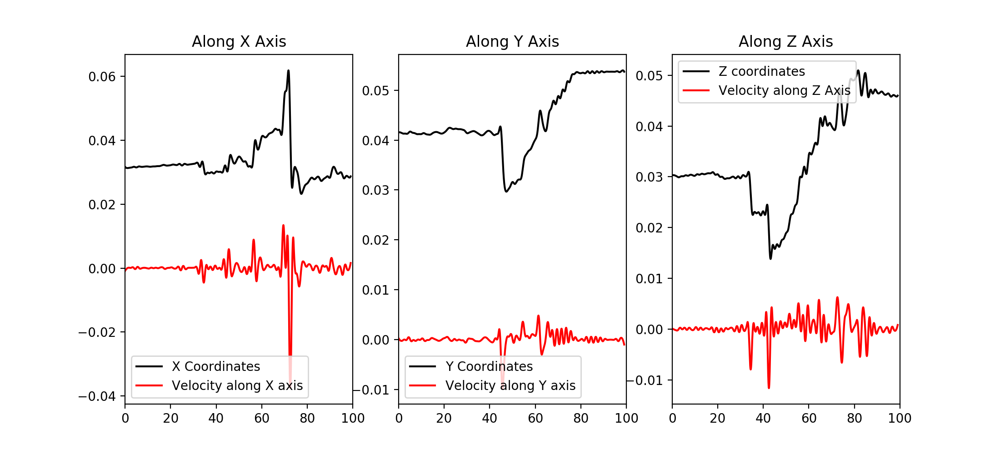

In [25]:
fig = plt.figure(figsize=(11,5))

plt.subplot(1, 3, 1)
plt.xlim(0, 100)
plt.title('Along X Axis')
# plt.ylim(-0.008, 0.004)
plt.plot(frame_axis2, x2_splined, color = 'black', label = 'X Coordinates')
plt.plot(frame_axis2, x2_vel, color = 'red', label = 'Velocity along X axis')
plt.legend(loc='lower left')

plt.subplot(1, 3, 2)
plt.xlim(0, 100)
plt.title('Along Y Axis')
# plt.ylim(-0.02, 0.02)
plt.plot(frame_axis2, y2_splined, color = 'black', label = 'Y Coordinates')
plt.plot(frame_axis2, y2_vel, color = 'red', label = 'Velocity along Y axis')
plt.legend(loc='lower left')

plt.subplot(1, 3, 3)
plt.xlim(0, 100)
plt.title('Along Z Axis')
# plt.ylim(-0.03, 0.03)
plt.plot(frame_axis2, z2_splined, color = 'black', label = 'Z coordinates')
plt.plot(frame_axis2, z2_vel, color = 'red', label = 'Velocity along Z Axis')
plt.legend(loc='upper left')
# fig = plt.figure(figsize=(10,15))

# plt.subplot(3, 3, 1)
# plt.xlim(0, 100)
# plt.title('X Coordinates')
# plt.plot(frame_axis2, x2_splined, color = 'black')
# plt.plot(frame_axis2, x2_vel, color = 'red')

# plt.subplot(3, 3, 2)
# plt.xlim(0, 100)
# plt.title('Y Coordinates')
# plt.plot(frame_axis2, y2_splined, color = 'black')
# plt.plot(frame_axis2, y2_vel, color = 'red')

# plt.subplot(3, 3, 3)
# plt.xlim(0, 100)
# plt.title('Z Coordinates')
# plt.plot(frame_axis2, z2_splined, color = 'black')
# plt.plot(frame_axis2, z2_vel, color = 'red')

# plt.subplot(3, 3, 4)
# plt.xlim(0, 100)
# plt.title('Velocity X')
# plt.plot(frame_axis2, x2_vel, color = 'black')

# plt.subplot(3, 3, 5)
# plt.xlim(0, 100)
# plt.title('Velocity Y')
# plt.plot(frame_axis2, y2_vel, color = 'black')

# plt.subplot(3, 3, 6)
# plt.xlim(0, 100)
# plt.title('Velocity Z')
# plt.plot(frame_axis2, z2_vel, color = 'black')

# plt.subplot(3, 3, 7)
# plt.xlim(0, 100)
# plt.title('Acc X')
# plt.plot(frame_axis2, x2_acc, color = 'black')

# plt.subplot(3, 3, 8)
# plt.xlim(0, 100)
# plt.title('Acc Y')
# plt.plot(frame_axis2, y2_acc, color = 'black')

# plt.subplot(3, 3, 9)
# plt.xlim(0, 100)
# plt.title('Acc Z')
# plt.plot(frame_axis2, z2_acc, color = 'black')

## Nose

In [27]:
cs_x = CubicSpline(frame_axis, x3)
cs_y = CubicSpline(frame_axis, y3)
cs_z = CubicSpline(frame_axis, z3)

x3_splined = cs_x(frame_axis2)
y3_splined = cs_y(frame_axis2)
z3_splined = cs_z(frame_axis2)

x3_vel = cs_x(frame_axis2, 1)
y3_vel = cs_y(frame_axis2, 1)
z3_vel = cs_z(frame_axis2, 1)

x3_acc = cs_x(frame_axis2, 2)
y3_acc = cs_y(frame_axis2, 2)
z3_acc = cs_z(frame_axis2, 2)

<IPython.core.display.Javascript object>


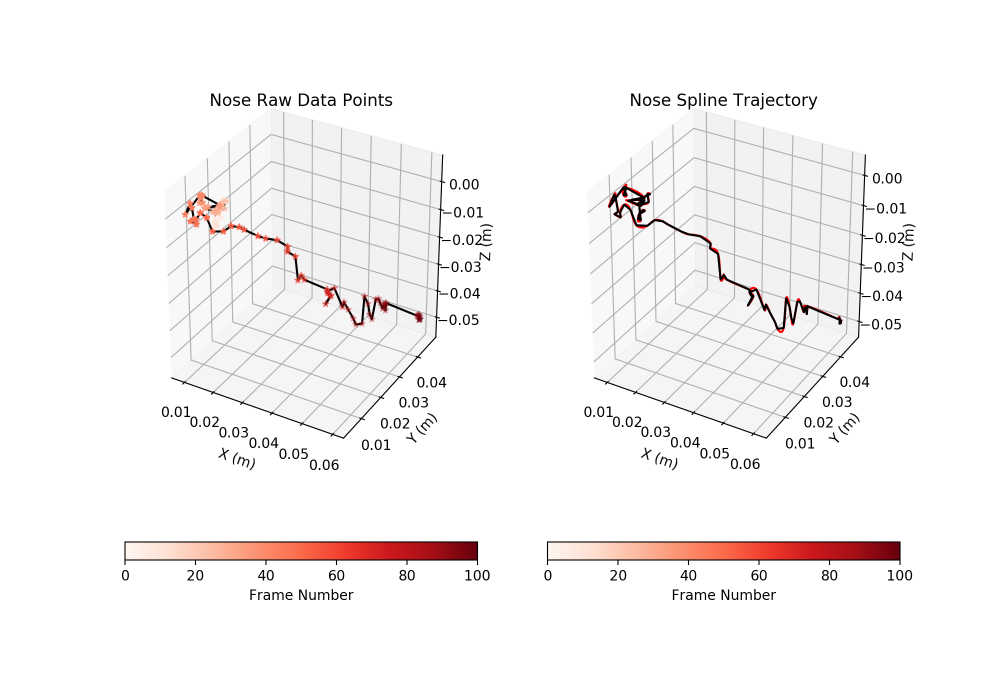

In [28]:
cm = plt.cm.get_cmap('Reds')
cm2 = plt.cm.get_cmap('Greens')

fig3 = pyplot.figure()
fig3.set_figheight(7)
fig3.set_figwidth(10)

ax = fig3.add_subplot(1, 2, 1, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Nose Raw Data Points')

p = ax.scatter(x3, y3, z3, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
ax.plot(x3, y3, z3, color = 'black')
cbar = fig3.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig3.add_subplot(1, 2, 2, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Nose Spline Trajectory')

# p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
ax.plot(x3_splined, y3_splined, z3_splined, color = 'red')
ax.plot(x3, y3, z3, color = 'black')
cbar = fig3.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

pyplot.show()

<IPython.core.display.Javascript object>


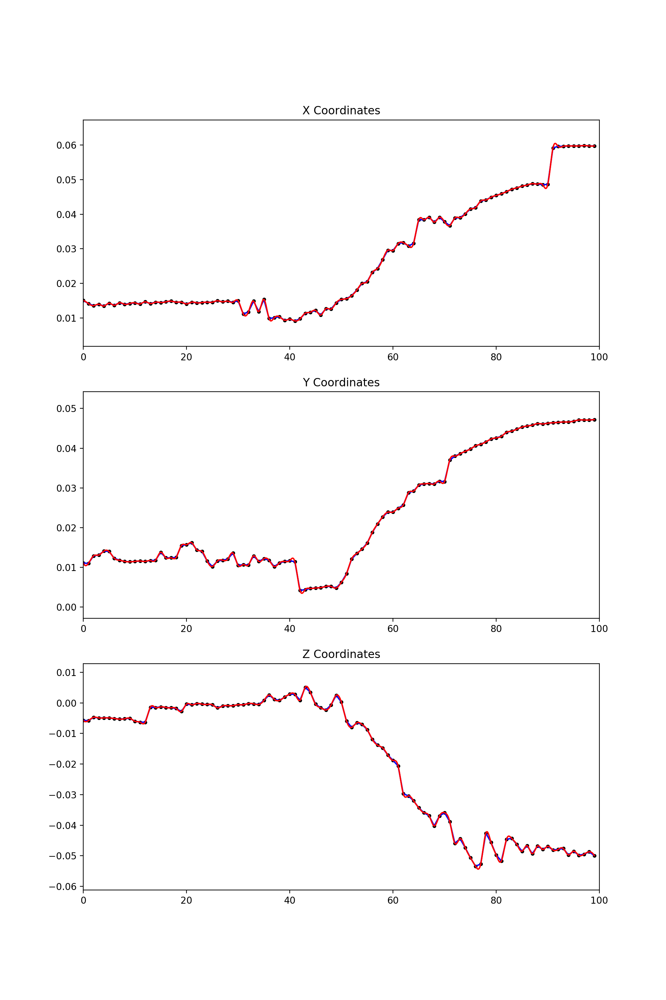

In [29]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 1, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.scatter(frame_axis, x3, marker = '.', color = 'black')
plt.plot(frame_axis, x3, color = 'b')
plt.plot(frame_axis2, x3_splined, color = 'r')

plt.subplot(3, 1, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.scatter(frame_axis, y3, marker = '.', color = 'black')
plt.plot(frame_axis, y3, color = 'b')
plt.plot(frame_axis2, y3_splined, color = 'r')

plt.subplot(3, 1, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.scatter(frame_axis, z3, marker = '.', color = 'black')
plt.plot(frame_axis, z3, color = 'b')
plt.plot(frame_axis2, z3_splined, color = 'r')

<IPython.core.display.Javascript object>


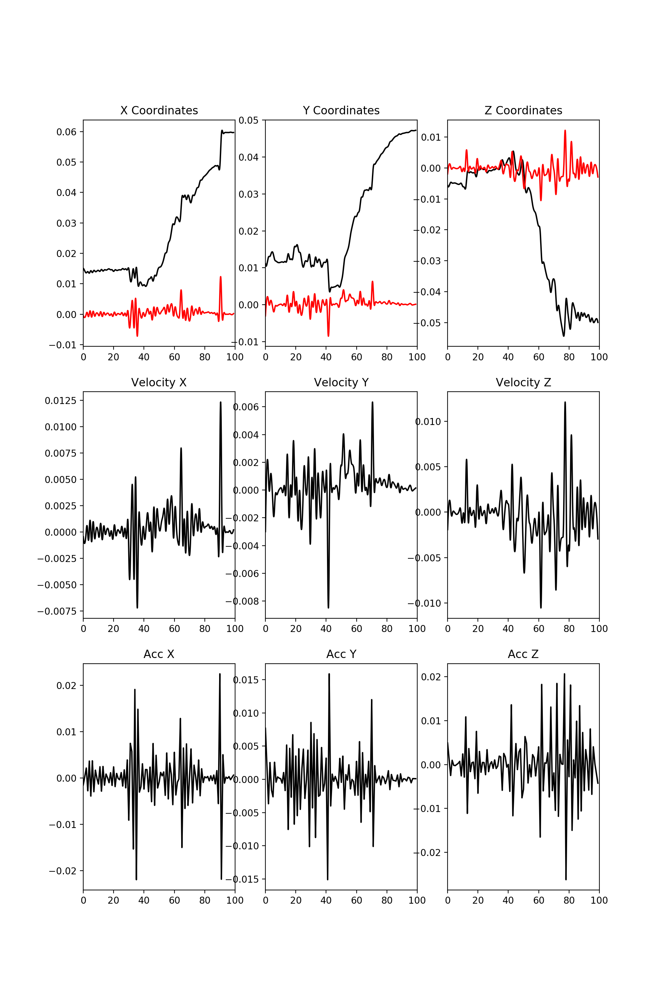

In [30]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 3, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.plot(frame_axis2, x3_splined, color = 'black')
plt.plot(frame_axis2, x3_vel, color = 'red')

plt.subplot(3, 3, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.plot(frame_axis2, y3_splined, color = 'black')
plt.plot(frame_axis2, y3_vel, color = 'red')

plt.subplot(3, 3, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.plot(frame_axis2, z3_splined, color = 'black')
plt.plot(frame_axis2, z3_vel, color = 'red')

plt.subplot(3, 3, 4)
plt.xlim(0, 100)
plt.title('Velocity X')
plt.plot(frame_axis2, x3_vel, color = 'black')

plt.subplot(3, 3, 5)
plt.xlim(0, 100)
plt.title('Velocity Y')
plt.plot(frame_axis2, y3_vel, color = 'black')

plt.subplot(3, 3, 6)
plt.xlim(0, 100)
plt.title('Velocity Z')
plt.plot(frame_axis2, z3_vel, color = 'black')

plt.subplot(3, 3, 7)
plt.xlim(0, 100)
plt.title('Acc X')
plt.plot(frame_axis2, x3_acc, color = 'black')

plt.subplot(3, 3, 8)
plt.xlim(0, 100)
plt.title('Acc Y')
plt.plot(frame_axis2, y3_acc, color = 'black')

plt.subplot(3, 3, 9)
plt.xlim(0, 100)
plt.title('Acc Z')
plt.plot(frame_axis2, z3_acc, color = 'black')

## Shoulder 1

In [31]:
cs_x = CubicSpline(frame_axis, x4)
cs_y = CubicSpline(frame_axis, y4)
cs_z = CubicSpline(frame_axis, z4)

x4_splined = cs_x(frame_axis2)
y4_splined = cs_y(frame_axis2)
z4_splined = cs_z(frame_axis2)

x4_vel = cs_x(frame_axis2, 1)
y4_vel = cs_y(frame_axis2, 1)
z4_vel = cs_z(frame_axis2, 1)

x4_acc = cs_x(frame_axis2, 2)
y4_acc = cs_y(frame_axis2, 2)
z4_acc = cs_z(frame_axis2, 2)

<IPython.core.display.Javascript object>


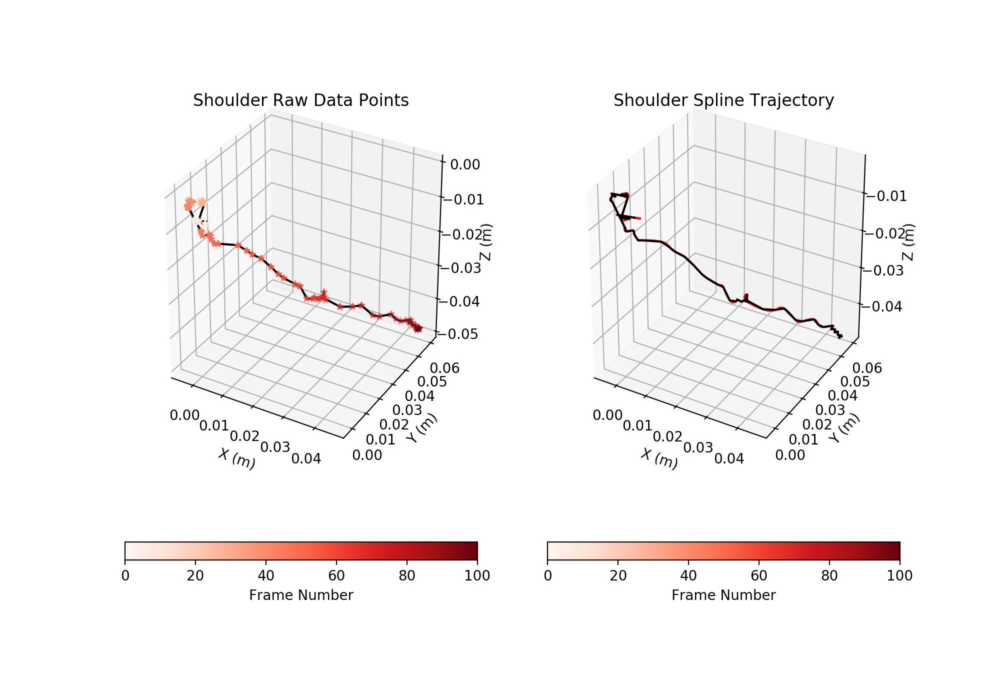

In [33]:
cm = plt.cm.get_cmap('Reds')
cm2 = plt.cm.get_cmap('Greens')

fig4 = pyplot.figure()
fig4.set_figheight(7)
fig4.set_figwidth(10)

ax = fig4.add_subplot(1, 2, 1, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder1 Raw Data Points')

p = ax.scatter(x4, y4, z4, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
ax.plot(x4, y4, z4, color = 'black')
cbar = fig4.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig4.add_subplot(1, 2, 2, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Shoulder1 Spline Trajectory')

# p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
ax.plot(x4_splined, y4_splined, z4_splined, color = 'red')
ax.plot(x4, y4, z4, color = 'black')
cbar = fig4.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

pyplot.show()

<IPython.core.display.Javascript object>


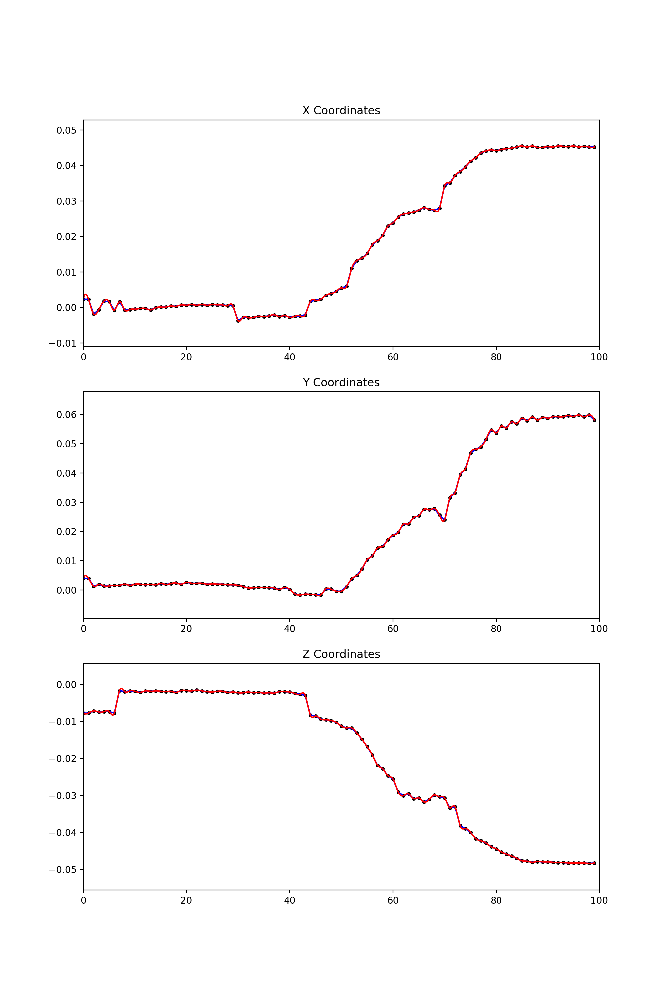

In [34]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 1, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.scatter(frame_axis, x4, marker = '.', color = 'black')
plt.plot(frame_axis, x4, color = 'b')
plt.plot(frame_axis2, x4_splined, color = 'r')

plt.subplot(3, 1, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.scatter(frame_axis, y4, marker = '.', color = 'black')
plt.plot(frame_axis, y4, color = 'b')
plt.plot(frame_axis2, y4_splined, color = 'r')

plt.subplot(3, 1, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.scatter(frame_axis, z4, marker = '.', color = 'black')
plt.plot(frame_axis, z4, color = 'b')
plt.plot(frame_axis2, z4_splined, color = 'r')

<IPython.core.display.Javascript object>


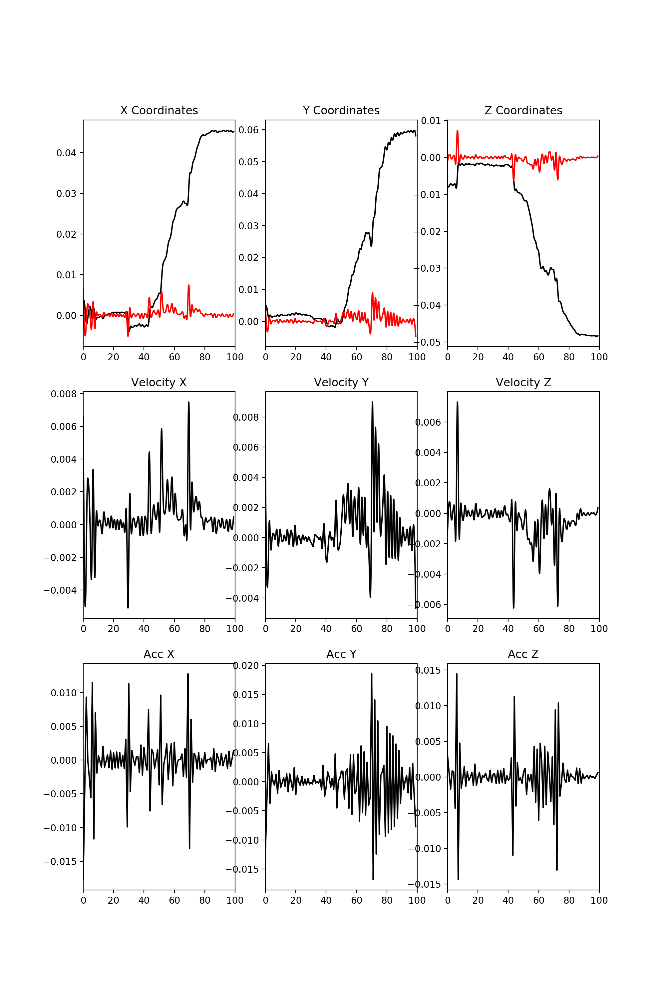

In [35]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 3, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.plot(frame_axis2, x4_splined, color = 'black')
plt.plot(frame_axis2, x4_vel, color = 'red')

plt.subplot(3, 3, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.plot(frame_axis2, y4_splined, color = 'black')
plt.plot(frame_axis2, y4_vel, color = 'red')

plt.subplot(3, 3, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.plot(frame_axis2, z4_splined, color = 'black')
plt.plot(frame_axis2, z4_vel, color = 'red')

plt.subplot(3, 3, 4)
plt.xlim(0, 100)
plt.title('Velocity X')
plt.plot(frame_axis2, x4_vel, color = 'black')

plt.subplot(3, 3, 5)
plt.xlim(0, 100)
plt.title('Velocity Y')
plt.plot(frame_axis2, y4_vel, color = 'black')

plt.subplot(3, 3, 6)
plt.xlim(0, 100)
plt.title('Velocity Z')
plt.plot(frame_axis2, z4_vel, color = 'black')

plt.subplot(3, 3, 7)
plt.xlim(0, 100)
plt.title('Acc X')
plt.plot(frame_axis2, x4_acc, color = 'black')

plt.subplot(3, 3, 8)
plt.xlim(0, 100)
plt.title('Acc Y')
plt.plot(frame_axis2, y4_acc, color = 'black')

plt.subplot(3, 3, 9)
plt.xlim(0, 100)
plt.title('Acc Z')
plt.plot(frame_axis2, z4_acc, color = 'black')

## Forearm1

In [36]:
cs_x = CubicSpline(frame_axis, x5)
cs_y = CubicSpline(frame_axis, y5)
cs_z = CubicSpline(frame_axis, z5)

x5_splined = cs_x(frame_axis2)
y5_splined = cs_y(frame_axis2)
z5_splined = cs_z(frame_axis2)

x5_vel = cs_x(frame_axis2, 1)
y5_vel = cs_y(frame_axis2, 1)
z5_vel = cs_z(frame_axis2, 1)

x5_acc = cs_x(frame_axis2, 2)
y5_acc = cs_y(frame_axis2, 2)
z5_acc = cs_z(frame_axis2, 2)

<IPython.core.display.Javascript object>


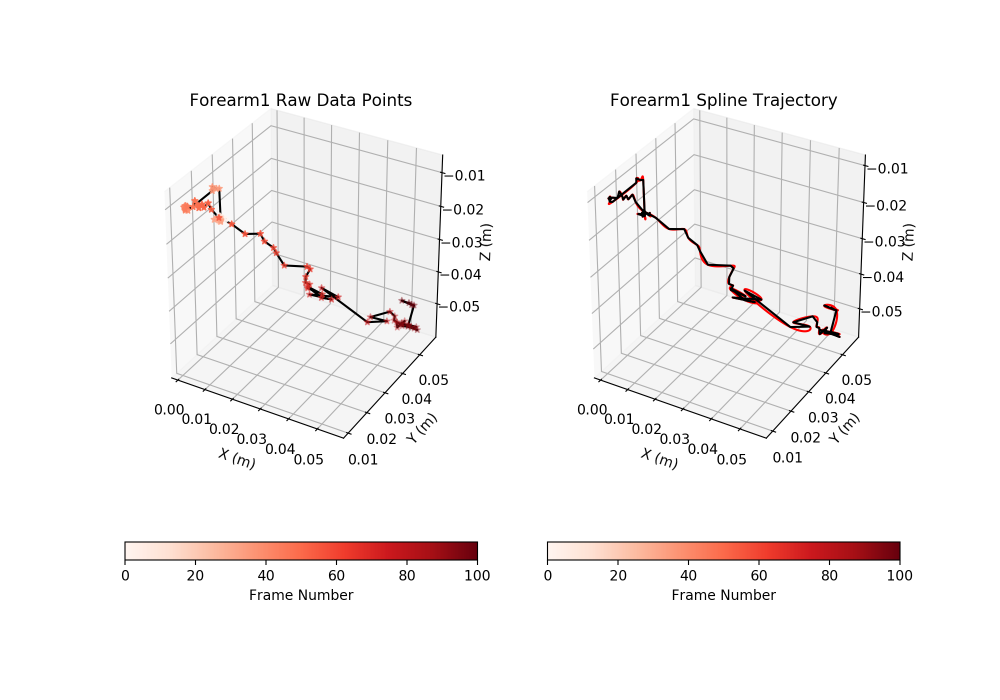

In [44]:
cm = plt.cm.get_cmap('Reds')
cm2 = plt.cm.get_cmap('Greens')

fig5 = pyplot.figure()
fig5.set_figheight(7)
fig5.set_figwidth(10)

ax = fig5.add_subplot(1, 2, 1, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Forearm1 Raw Data Points')

p = ax.scatter(x5, y5, z5, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
ax.plot(x5, y5, z5, color = 'black')
cbar = fig5.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig5.add_subplot(1, 2, 2, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Forearm1 Spline Trajectory')

# p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
ax.plot(x5_splined, y5_splined, z5_splined, color = 'red')
ax.plot(x5, y5, z5, color = 'black')
cbar = fig5.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

pyplot.show()

<IPython.core.display.Javascript object>


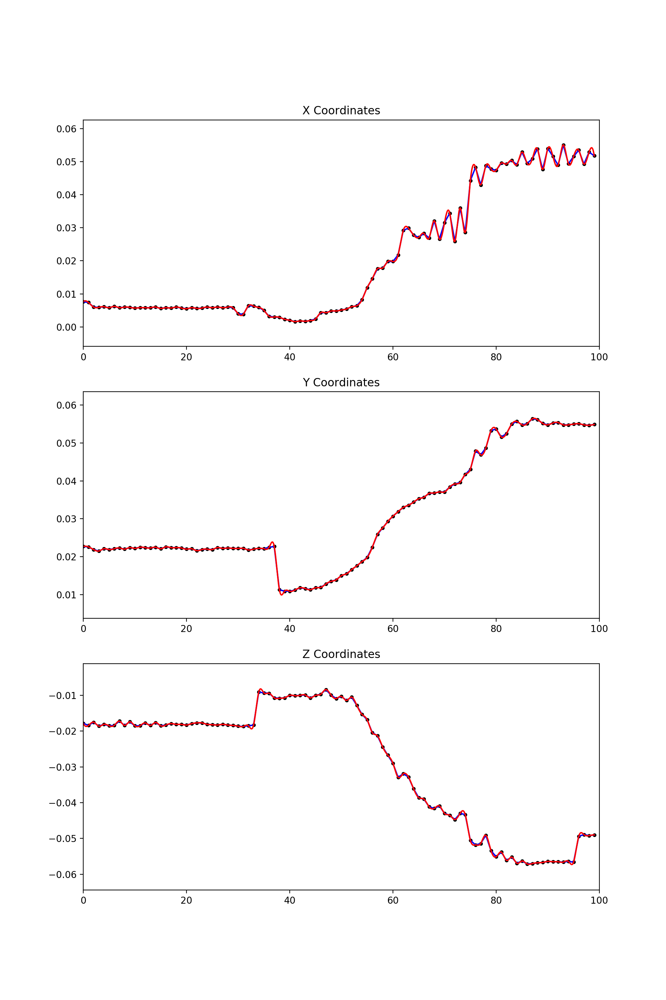

In [39]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 1, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.scatter(frame_axis, x5, marker = '.', color = 'black')
plt.plot(frame_axis, x5, color = 'b')
plt.plot(frame_axis2, x5_splined, color = 'r')

plt.subplot(3, 1, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.scatter(frame_axis, y5, marker = '.', color = 'black')
plt.plot(frame_axis, y5, color = 'b')
plt.plot(frame_axis2, y5_splined, color = 'r')

plt.subplot(3, 1, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.scatter(frame_axis, z5, marker = '.', color = 'black')
plt.plot(frame_axis, z5, color = 'b')
plt.plot(frame_axis2, z5_splined, color = 'r')

<IPython.core.display.Javascript object>


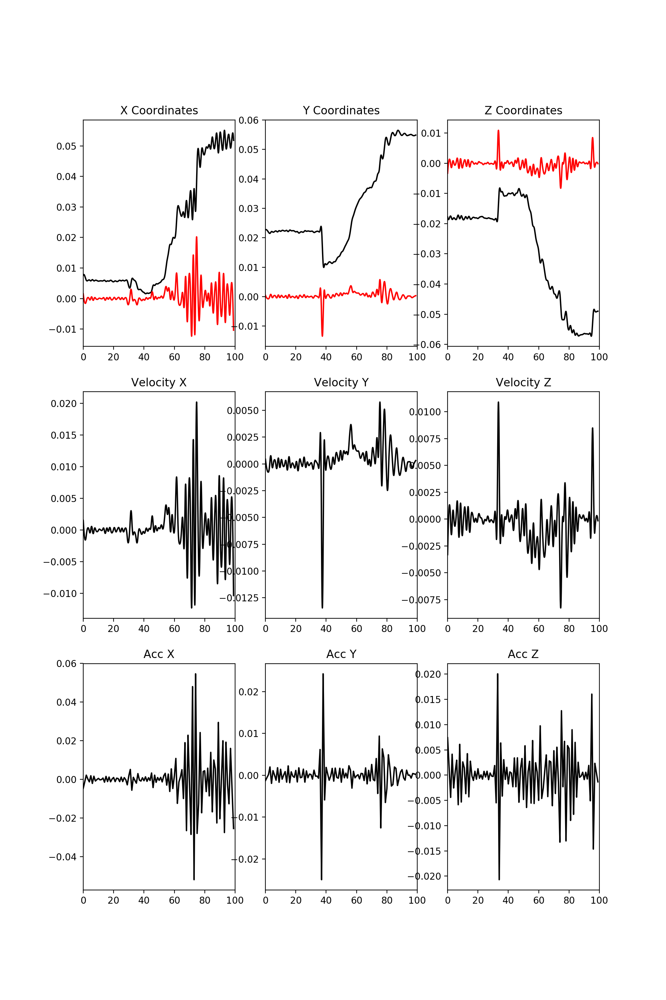

In [40]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 3, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.plot(frame_axis2, x5_splined, color = 'black')
plt.plot(frame_axis2, x5_vel, color = 'red')

plt.subplot(3, 3, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.plot(frame_axis2, y5_splined, color = 'black')
plt.plot(frame_axis2, y5_vel, color = 'red')

plt.subplot(3, 3, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.plot(frame_axis2, z5_splined, color = 'black')
plt.plot(frame_axis2, z5_vel, color = 'red')

plt.subplot(3, 3, 4)
plt.xlim(0, 100)
plt.title('Velocity X')
plt.plot(frame_axis2, x5_vel, color = 'black')

plt.subplot(3, 3, 5)
plt.xlim(0, 100)
plt.title('Velocity Y')
plt.plot(frame_axis2, y5_vel, color = 'black')

plt.subplot(3, 3, 6)
plt.xlim(0, 100)
plt.title('Velocity Z')
plt.plot(frame_axis2, z5_vel, color = 'black')

plt.subplot(3, 3, 7)
plt.xlim(0, 100)
plt.title('Acc X')
plt.plot(frame_axis2, x5_acc, color = 'black')

plt.subplot(3, 3, 8)
plt.xlim(0, 100)
plt.title('Acc Y')
plt.plot(frame_axis2, y5_acc, color = 'black')

plt.subplot(3, 3, 9)
plt.xlim(0, 100)
plt.title('Acc Z')
plt.plot(frame_axis2, z5_acc, color = 'black')

## Palm1

In [41]:
cs_x = CubicSpline(frame_axis, x6)
cs_y = CubicSpline(frame_axis, y6)
cs_z = CubicSpline(frame_axis, z6)

x6_splined = cs_x(frame_axis2)
y6_splined = cs_y(frame_axis2)
z6_splined = cs_z(frame_axis2)

x6_vel = cs_x(frame_axis2, 1)
y6_vel = cs_y(frame_axis2, 1)
z6_vel = cs_z(frame_axis2, 1)

x6_acc = cs_x(frame_axis2, 2)
y6_acc = cs_y(frame_axis2, 2)
z6_acc = cs_z(frame_axis2, 2)

<IPython.core.display.Javascript object>


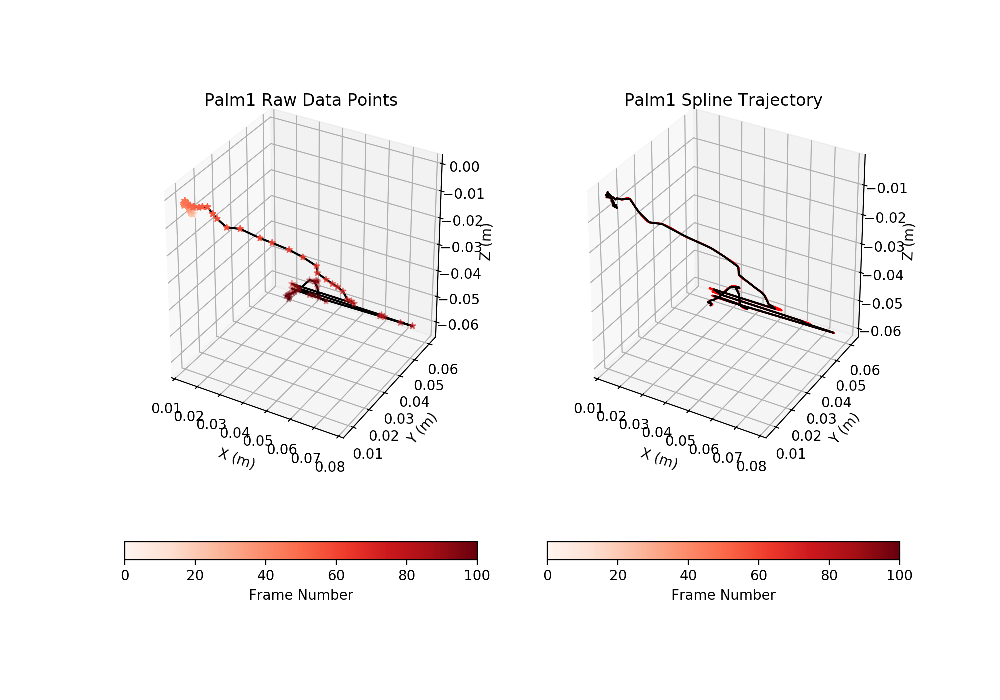

In [45]:
cm = plt.cm.get_cmap('Reds')
cm2 = plt.cm.get_cmap('Greens')

fig6 = pyplot.figure()
fig6.set_figheight(7)
fig6.set_figwidth(10)

ax = fig6.add_subplot(1, 2, 1, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm1 Raw Data Points')

p = ax.scatter(x6, y6, z6, c = c,vmin=0, vmax=100,cmap=cm, marker = '*')
ax.plot(x6, y6, z6, color = 'black')
cbar = fig6.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

ax = fig6.add_subplot(1, 2, 2, projection='3d')

# ax.set_xlim3d([-0.05, 0.05])
# ax.set_ylim3d([-0.05, 0.05])
# ax.set_zlim3d([-0.05, 0.05])
ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('Palm1 Spline Trajectory')

# p = ax.scatter(x1, y1, z1, c = c,vmin=0, vmax=100,cmap=cm, marker = 'o')
ax.plot(x6_splined, y6_splined, z6_splined, color = 'red')
ax.plot(x6, y6, z6, color = 'black')
cbar = fig6.colorbar(p, orientation = 'horizontal')
cbar.set_label('Frame Number')

pyplot.show()

<IPython.core.display.Javascript object>


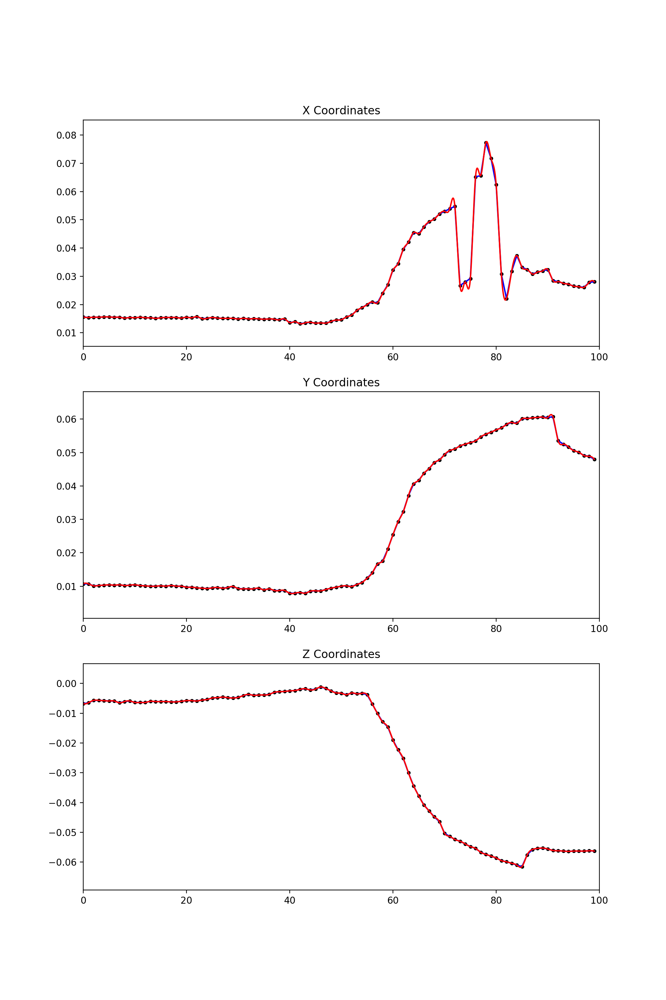

In [43]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 1, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.scatter(frame_axis, x6, marker = '.', color = 'black')
plt.plot(frame_axis, x6, color = 'b')
plt.plot(frame_axis2, x6_splined, color = 'r')

plt.subplot(3, 1, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.scatter(frame_axis, y6, marker = '.', color = 'black')
plt.plot(frame_axis, y6, color = 'b')
plt.plot(frame_axis2, y6_splined, color = 'r')

plt.subplot(3, 1, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.scatter(frame_axis, z6, marker = '.', color = 'black')
plt.plot(frame_axis, z6, color = 'b')
plt.plot(frame_axis2, z6_splined, color = 'r')

<IPython.core.display.Javascript object>


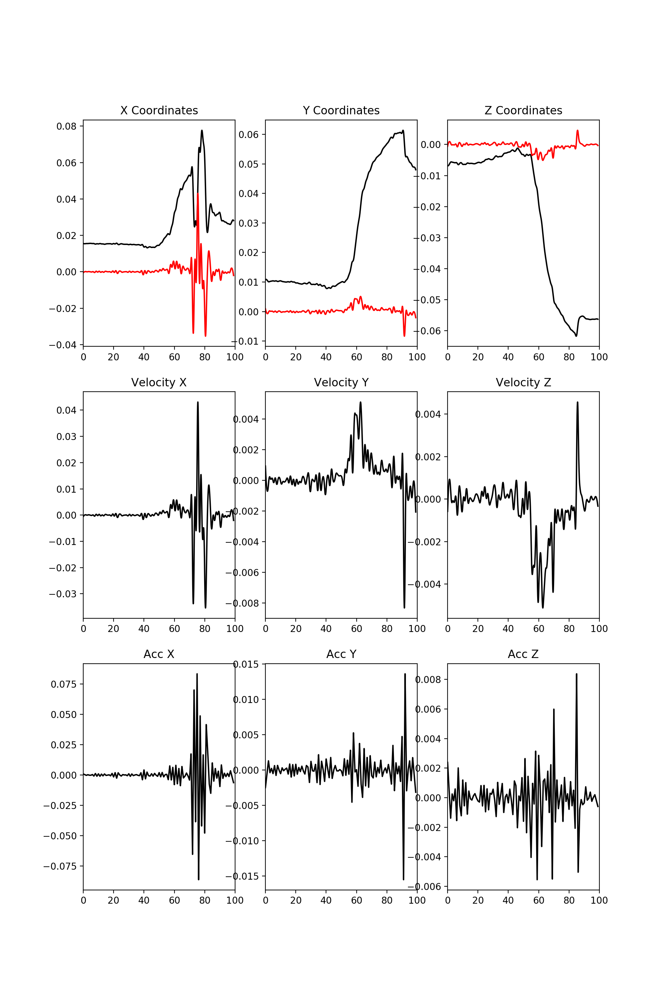

In [46]:
fig = plt.figure(figsize=(10,15))

plt.subplot(3, 3, 1)
plt.xlim(0, 100)
plt.title('X Coordinates')
plt.plot(frame_axis2, x6_splined, color = 'black')
plt.plot(frame_axis2, x6_vel, color = 'red')

plt.subplot(3, 3, 2)
plt.xlim(0, 100)
plt.title('Y Coordinates')
plt.plot(frame_axis2, y6_splined, color = 'black')
plt.plot(frame_axis2, y6_vel, color = 'red')

plt.subplot(3, 3, 3)
plt.xlim(0, 100)
plt.title('Z Coordinates')
plt.plot(frame_axis2, z6_splined, color = 'black')
plt.plot(frame_axis2, z6_vel, color = 'red')

plt.subplot(3, 3, 4)
plt.xlim(0, 100)
plt.title('Velocity X')
plt.plot(frame_axis2, x6_vel, color = 'black')

plt.subplot(3, 3, 5)
plt.xlim(0, 100)
plt.title('Velocity Y')
plt.plot(frame_axis2, y6_vel, color = 'black')

plt.subplot(3, 3, 6)
plt.xlim(0, 100)
plt.title('Velocity Z')
plt.plot(frame_axis2, z6_vel, color = 'black')

plt.subplot(3, 3, 7)
plt.xlim(0, 100)
plt.title('Acc X')
plt.plot(frame_axis2, x6_acc, color = 'black')

plt.subplot(3, 3, 8)
plt.xlim(0, 100)
plt.title('Acc Y')
plt.plot(frame_axis2, y6_acc, color = 'black')

plt.subplot(3, 3, 9)
plt.xlim(0, 100)
plt.title('Acc Z')
plt.plot(frame_axis2, z6_acc, color = 'black')